# Data Engineering and Analysis of Machine Learning Algorithms

### Let us consider a custom masked dataset to analyze and understand the importance of feature engineering and model evaluations

Read dataset

In [54]:
#Import Train and Test Data
import pandas as pd
pd.set_option('display.max_rows', None)
train = pd.read_csv('a4-train.csv', index_col=0)
test = pd.read_csv('a4-test.csv', index_col=0)


#### Let us perform exploratory data analysis

In [55]:
#Describing Train data to understand the distribution of the data and other statistics
train.describe()

,feat_0,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_491,feat_492,feat_493,feat_494,feat_495,feat_496,feat_497,feat_498,feat_499,labels
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,...,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,481.722500,483.452500,510.166000,483.384500,501.612500,479.259000,480.109500,476.565000,486.793500,478.78900,...,478.811500,486.356500,496.565500,493.49950,510.893000,478.219500,483.309000,507.977000,490.266000,0.500000
std,6.421769,30.186294,38.899165,9.059895,41.389418,6.795956,40.575925,1.384461,15.043836,7.19092,...,4.011735,23.967366,127.635442,34.81902,37.459353,5.880613,13.559847,37.224297,25.825273,0.500125
min,462.000000,381.000000,370.000000,453.000000,371.000000,459.000000,334.000000,471.000000,430.000000,455.00000,...,463.000000,391.000000,130.000000,368.00000,398.000000,457.000000,435.000000,363.000000,403.000000,0.000000
25%,477.000000,464.000000,485.000000,477.000000,475.000000,475.000000,452.750000,476.000000,477.000000,474.00000,...,476.000000,471.000000,404.000000,470.00000,486.000000,474.000000,474.000000,482.000000,473.000000,0.000000
50%,482.000000,483.000000,510.500000,483.000000,500.000000,479.000000,480.000000,477.000000,487.000000,479.00000,...,479.000000,486.000000,504.000000,492.00000,511.000000,478.000000,483.000000,508.000000,490.000000,0.500000
75%,486.000000,503.000000,536.000000,490.000000,528.000000,484.000000,506.250000,477.000000,496.250000,484.00000,...,481.000000,502.000000,586.000000,517.00000,535.000000,482.000000,492.000000,533.000000,507.250000,1.000000
max,503.000000,600.000000,654.000000,519.000000,688.000000,505.000000,611.000000,481.000000,536.000000,503.00000,...,497.000000,566.000000,920.000000,615.00000,661.000000,500.000000,535.000000,644.000000,583.000000,1.000000


In [56]:
#Checking whether any null values present in train or test data
print(train.isnull().values.any())
print(test.isnull().values.any())

False
False


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


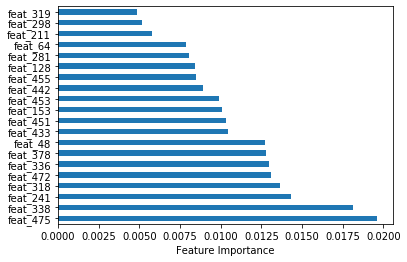

In [57]:
#Visualizing Feature Importances

from sklearn.ensemble import RandomForestClassifier
import numpy as np
import matplotlib.pyplot as plt

x=train.copy()
y=train.labels
x=x.drop('labels', axis=1)

#Random forest classifier for feature importance
rfc=RandomForestClassifier()
rfc.fit(x,y)

feat_importances = pd.Series(rfc.feature_importances_, index=x.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.xlabel('Feature Importance')
plt.show()

Correlation Heatmap for all features:


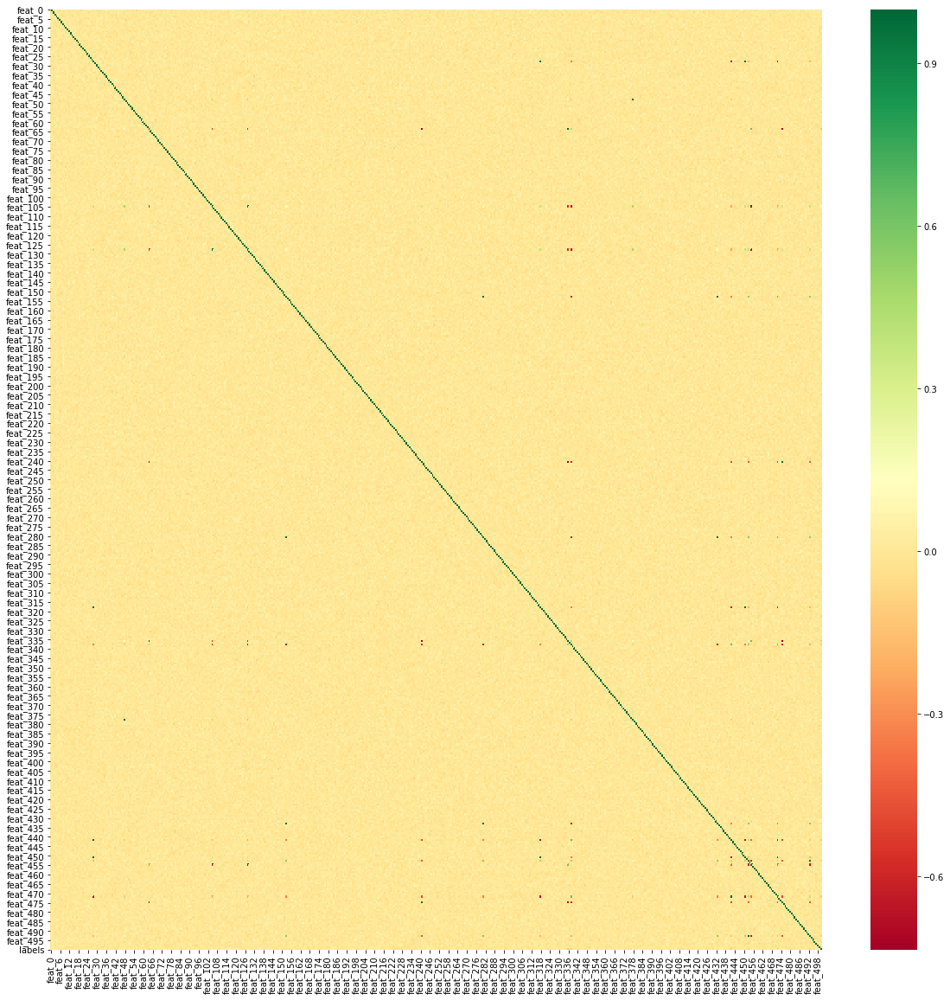

Correlation Heatmap for a range where most correlated features are present:


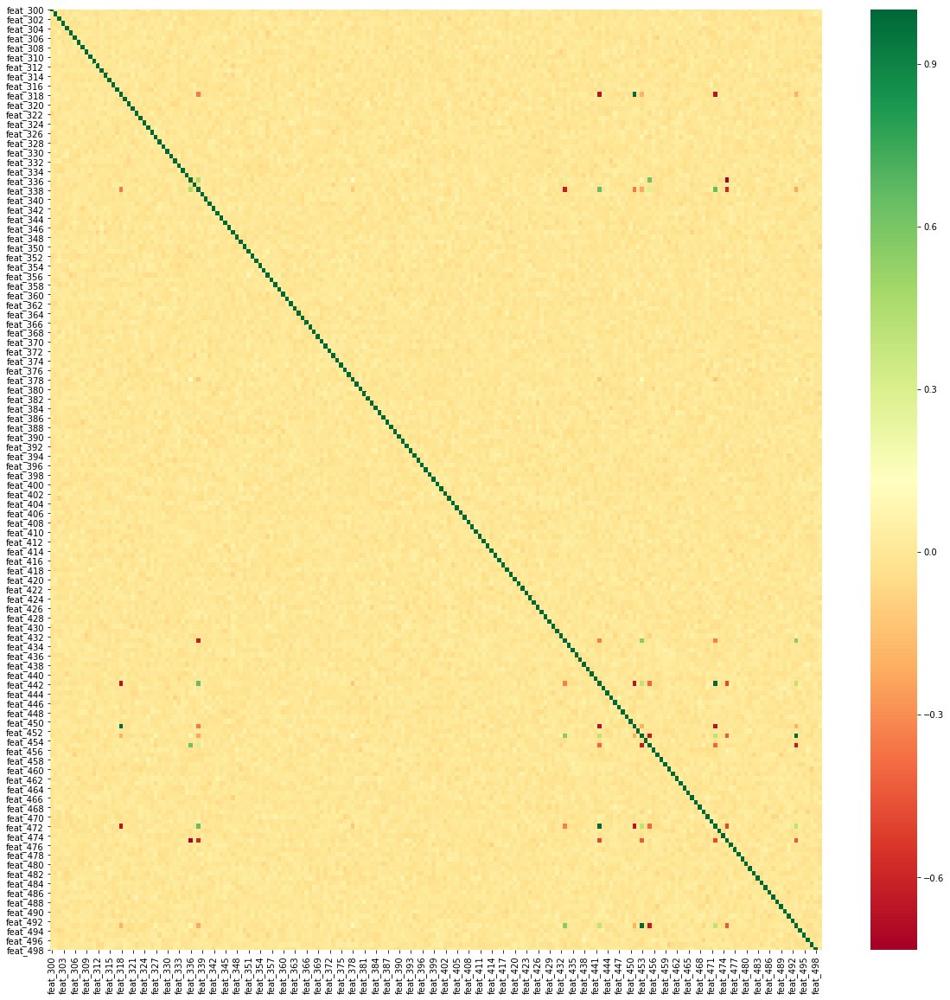

In [770]:
#Identifying highly correlated features

#!pip install seaborn

#Correlation heatmap
import matplotlib.pyplot as plt
import seaborn as sns

corrilation_matrix = train.iloc[:,:].corr()
top_cor_feat = corrilation_matrix.index
plt.figure(figsize=(20,20))

print("Correlation Heatmap for all features:")
g=sns.heatmap(train[top_cor_feat].corr(),annot=False,cmap="RdYlGn")
plt.show()
corrilation_matrix = train.iloc[:,300:500].corr()
top_cor_feat = corrilation_matrix.index
plt.figure(figsize=(20,20))

print("Correlation Heatmap for a range where most correlated features are present:")
g=sns.heatmap(train[top_cor_feat].corr(),annot=False,cmap="RdYlGn")
plt.show()

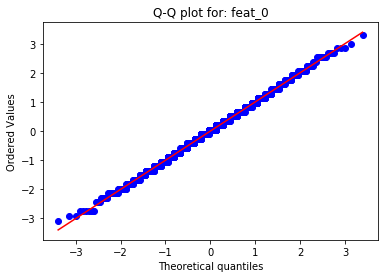

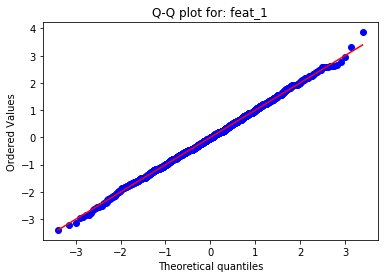

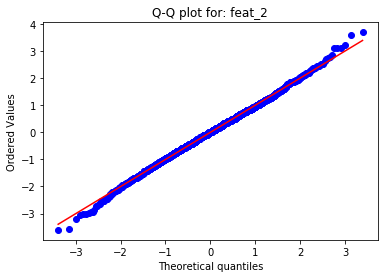

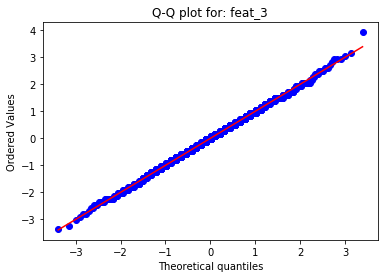

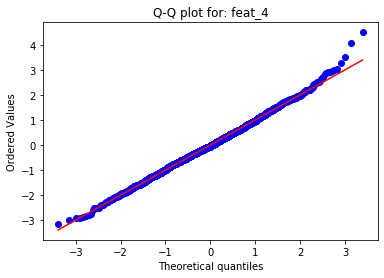

...

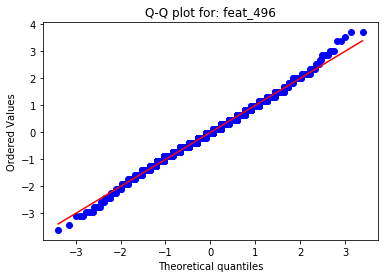

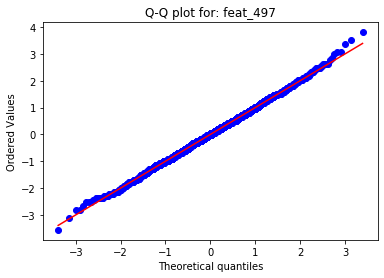

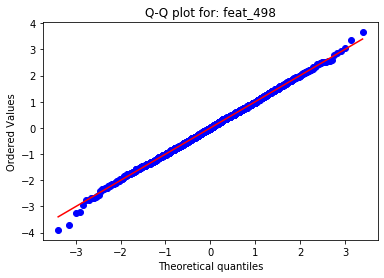

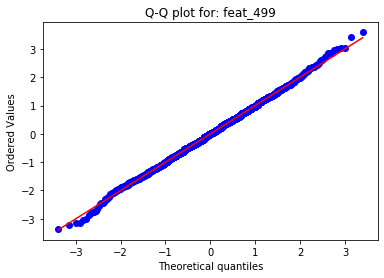

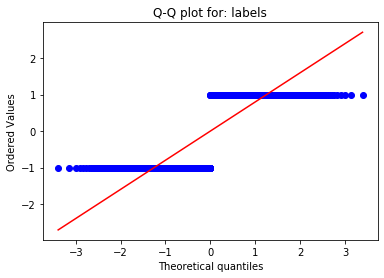

In [771]:
#Q-Q plot to check whether the columns are normally distributed

import scipy.stats as stats
cols=train.columns
for i in range(len(cols)):
    z = (train[cols[i]]-np.mean(train[cols[i]]))/np.std(train[cols[i]])
    stats.probplot(z, dist="norm", plot=plt)
    plt.title("Q-Q plot for: %s"%(cols[i]))
    plt.show()
    
#We can observe that few features are not normally distributed

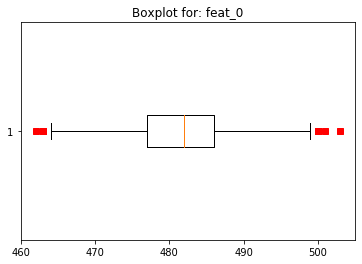

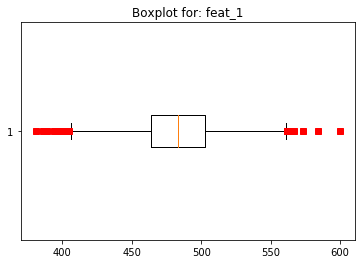

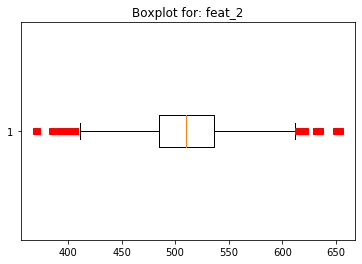

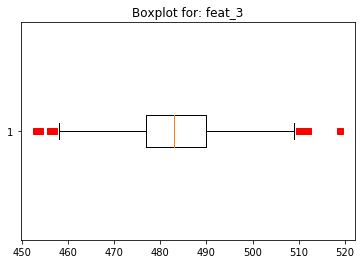

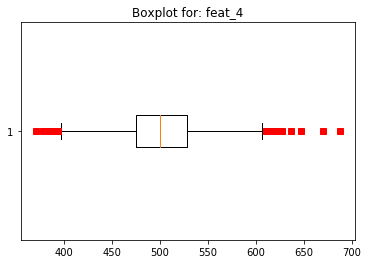

...

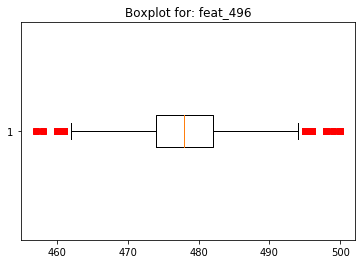

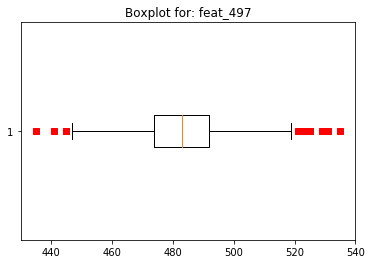

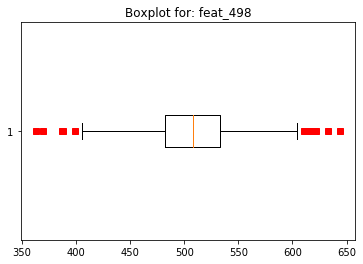

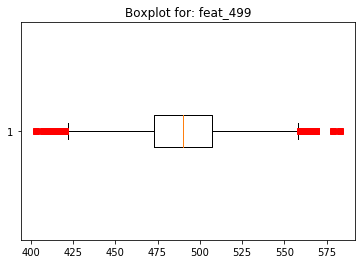

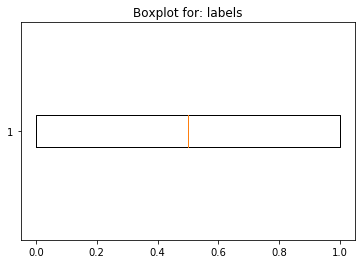

In [78]:
#Checking for outliers - points outside the whiskers of boxplot are outliers

import matplotlib.pyplot as plt

cols=train.columns
for i in range(len(cols)):
    plt.boxplot(train[cols[i]], 0, 'rs', 0)
    plt.title("Boxplot for: %s"%(cols[i]))
    plt.show()


#We can observe that many features have outliers

#### Feature engineering. On this task we will write code to modify your features such that the model can achieve a higher accuracy.

Let us use scikit-learn's logistic regression to establish a baseline model.

In [58]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression

#Creating x_tran, y_train, x_test, y_test

x_train=train.iloc[:,:-1]
y_train=train.iloc[:,-1]
x_test=test.iloc[:,:-1]
y_test=test.iloc[:,-1]

clf = LogisticRegression(penalty='l2', C=0.5, solver='lbfgs',max_iter=5000).fit(x_train, y_train)
clf.predict(x_test)
print("Test score of Logistic Regression Before Feature Engineering:",clf.score(x_test,y_test))

Test score of Logistic Regression Before Feature Engineering: 0.5833333333333334


**Removing Highly Correlated Features**

> Correlated Features may not necessarily improve the performance of our model. These features are redundant on our models as we have many features in our dataset. Instead of reducing dimentionality by dropping random features, we can drop the correlated features for the better performance of our models. Also, correlated features negetively affect the random forest classifiers.

In [59]:
#Removing Highly Correlated Columns

from sklearn.linear_model import LogisticRegression
import numpy as np

#Dropping correlated columns referred from stackoverflow
corr_matrix = train.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
train.drop(to_drop, axis=1, inplace=True)
test.drop(to_drop, axis=1, inplace=True)

x_train=train.iloc[:,:-1]
y_train=train.iloc[:,-1]
x_test=test.iloc[:,:-1]
y_test=test.iloc[:,-1]

**Important Feature Selection**
>Since we have a large number of features within our dataset, in order to improve the perfermance of our model, we need to select only the important features. Also, Model can overfit when we have too many features.

In [60]:
#Important Feature Selection

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

classifier = RandomForestClassifier(n_estimators=150)

classifier.fit(x_train, y_train)
sfm = SelectFromModel(classifier,max_features=10)
sfm.fit(x_train, y_train)

x_train = sfm.transform(x_train)
x_test = sfm.transform(x_test)

x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

**Logarithmic Transformation**
>Since we have few features within our dataset which are not normally distributed. Log transformation normally distributes these feature values. Log transformation also removes the possible skewness in the dataset.

In [61]:
for column in x_train.columns:
    x_train[column]=np.log(x_train[column]+1)

for column in x_test.columns:
    x_test[column]=np.log(x_test[column]+1)

**Standardization of Data**
> Standardization will transform our data so that its distribution will have zero mean and unit varience. This process will improve the performance of classification models.

In [63]:
from sklearn.preprocessing import StandardScaler

x_train = StandardScaler().fit_transform(x_train)
x_train = pd.DataFrame(x_train)

x_test=StandardScaler().fit_transform(x_test)
x_test = pd.DataFrame(x_test)


clf = LogisticRegression(penalty='l2',C=1/0.6, solver='lbfgs',max_iter=5000).fit(x_train, y_train)
clf.predict(x_test)
print("Test score of Logistic Regression After Feature Engineering:",clf.score(x_test,y_test))


Test score of Logistic Regression After Feature Engineering: 0.5883333333333334


### Model building & evaluation.


1.   Neural network (any type of NN is fine)
2.   Decision tree (can be a plain decision tree, random forest, gradient boosted trees, etc.)
3.   Support vector machine
4.   Any Naive Bayes or K-nearest neighbors

In [77]:
#Neural Network

import keras
from keras.models import Sequential
from keras.layers import Dense

nn = Sequential()
nn.add(Dense(100, input_dim=10, activation='relu'))
nn.add(Dense(100, activation='relu'))
nn.add(Dense(1, activation='sigmoid'))
          
nn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
          
nn.fit(x_train, y_train, epochs=50, batch_size=64)
loss,accuracy = nn.evaluate(x_test,y_test, verbose=0)
print("Accuracy of Neural Network:",accuracy)


Epoch 1/50
2000/2000 [==============================] - 0s 81us/step - loss: 0.6516 - accuracy: 0.6095
Epoch 2/50
2000/2000 [==============================] - 0s 23us/step - loss: 0.5763 - accuracy: 0.7205
Epoch 3/50
2000/2000 [==============================] - 0s 19us/step - loss: 0.5305 - accuracy: 0.7685
Epoch 4/50
2000/2000 [==============================] - 0s 18us/step - loss: 0.4954 - accuracy: 0.7900
Epoch 5/50
2000/2000 [==============================] - 0s 17us/step - loss: 0.4629 - accuracy: 0.8035
Epoch 6/50
2000/2000 [==============================] - 0s 17us/step - loss: 0.4355 - accuracy: 0.8220
Epoch 7/50
2000/2000 [==============================] - 0s 17us/step - loss: 0.4164 - accuracy: 0.8265
Epoch 8/50
2000/2000 [==============================] - 0s 17us/step - loss: 0.3917 - accuracy: 0.8405
Epoch 9/50
2000/2000 [==============================] - 0s 18us/step - loss: 0.3814 - accuracy: 0.8430
Epoch 10/50
2000/2000 [==============================] - 0s 18us/step - l

In [65]:
#Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

classifier=RandomForestClassifier(n_estimators=120)
classifier.fit(x_train,y_train)

y_pred=classifier.predict(x_test)

print("Accuracy of Random Forest Classifier:",metrics.accuracy_score(y_test, y_pred))

Accuracy of Random Forest Classifier: 0.8816666666666667


In [66]:
#AdaBoost Classifier

from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics


adaBoost = AdaBoostClassifier(n_estimators=10,learning_rate=0.5)
model = adaBoost.fit(x_train, y_train)

y_pred = model.predict(x_test)

print("Accuracy of AdaBoost Classifier:",metrics.accuracy_score(y_test, y_pred))

Accuracy of AdaBoost Classifier: 0.6016666666666667


In [67]:
#XGBoost Classifier
#!pip install xgboost
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

classifier = XGBClassifier(n_estimators=150, max_depth=20)
classifier.fit(x_train, y_train)

y_pred = classifier.predict(x_test)

print("Accuracy XGBoost Classifier:", accuracy_score(y_test, y_pred))

Accuracy XGBoost Classifier: 0.87


In [68]:
#Support vector machine

from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

svclassifier = SVC(kernel='sigmoid')
svclassifier.fit(x_train, y_train)

print("Accuracy Support Vector Machine:",accuracy_score(y_test, y_pred))

Accuracy Support Vector Machine: 0.87


**K Nearest Neighbours**
>K Nearest Neighbours algorithm works on the basic assumption that the similar points lie close to each other. KNN algorithm will classify a datapoint into a class based on the 'vote' of its neighbours. For a given datapoint, a set of K nearest points are computed based on their distances, then based on the mejority class of the K neighbours, the current datapoint is classified. 


>For example, for a current object let say a 'X', we find the K nearest objects by distance(Let say most these objects are Y s), then the current object X is classified into the class Y.

In [69]:
#K Nearest Neighbours

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=15)
knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)

print("Accuracy K Nearest Neighbours:",accuracy_score(y_test, y_pred))


Accuracy K Nearest Neighbours: 0.905


In [48]:
#Gaussian Naive Bayes

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

gaussian_nb = GaussianNB()
gaussian_nb.fit(x_train, y_train)

y_pred = gaussian_nb.predict(x_test)

print("Accuracy Gaussian Naive Bayes:",accuracy_score(y_test, y_pred))

Accuracy Gaussian Naive Bayes: 0.6133333333333333


In [49]:
#Bernoulli Naive Bayes

from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score

bernoulli_nb = BernoulliNB()
bernoulli_nb.fit(x_train, y_train)

y_pred = bernoulli_nb.predict(x_test)

print("Accuracy Bernoulli Naive Bayes:",accuracy_score(y_test, y_pred))

Accuracy Bernoulli Naive Bayes: 0.61
